In [7]:
# import
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib
%matplotlib inline

In [8]:
# 데이터 가져오기
df = pd.read_csv('../data/BankChurners.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [9]:
# column drop
df = df.drop(columns=['CLIENTNUM', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'])

df.head(2)                 

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105


In [10]:
# rename columns
new_names = {'Attrition_Flag' : 'Exited',
                    'Customer_Age' : 'Age',
                    'Dependent_count' : 'Dependents',
                    'Education_Level' : 'Education',
                    'Marital_Status' : 'Marital',
                    'Income_Category': 'Income',
                    'Card_Category' : 'Card_Type',
                    'Months_on_book' : 'Tenure',
                    'Total_Relationship_Count' : 'Product_Cnt',
                    'Months_Inactive_12_mon' : 'Inactive_Months',
                    'Contacts_Count_12_mon' : 'Contacts_Cnt',
                    'Total_Revolving_Bal' : 'Revolv_Bal',
                    'Avg_Open_To_Buy' : 'Avg_OTB',
                    'Avg_Utilization_Ratio' : 'Avg_Util_Ratio',
                    'Total_Trans_Amt' : 'Trans_Amt',
                    'Total_Trans_Ct' : 'Trans_Cnt',
                    'Total_Amt_Chng_Q4_Q1' : 'Amt_Chng_Q4_Q1',
                    'Total_Ct_Chng_Q4_Q1' : 'Cnt_Chng_Q4_Q1'
}

df = df.rename(columns=new_names)

In [11]:
# column 순서변경
df = df[['Exited', 'Age', 'Gender', 'Dependents', 'Education', 'Marital', 'Income', 'Card_Type', 'Tenure', 'Product_Cnt', 'Inactive_Months', 'Contacts_Cnt', 'Credit_Limit', 'Revolv_Bal', 'Avg_OTB', 'Avg_Util_Ratio', 'Trans_Amt', 'Trans_Cnt', 'Amt_Chng_Q4_Q1', 'Cnt_Chng_Q4_Q1']]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Exited           10127 non-null  object 
 1   Age              10127 non-null  int64  
 2   Gender           10127 non-null  object 
 3   Dependents       10127 non-null  int64  
 4   Education        10127 non-null  object 
 5   Marital          10127 non-null  object 
 6   Income           10127 non-null  object 
 7   Card_Type        10127 non-null  object 
 8   Tenure           10127 non-null  int64  
 9   Product_Cnt      10127 non-null  int64  
 10  Inactive_Months  10127 non-null  int64  
 11  Contacts_Cnt     10127 non-null  int64  
 12  Credit_Limit     10127 non-null  float64
 13  Revolv_Bal       10127 non-null  int64  
 14  Avg_OTB          10127 non-null  float64
 15  Avg_Util_Ratio   10127 non-null  float64
 16  Trans_Amt        10127 non-null  int64  
 17  Trans_Cnt   

In [6]:
df.describe()

,Age,Dependents,Tenure,Product_Cnt,Inactive_Months,Contacts_Cnt,Credit_Limit,Revolv_Bal,Avg_OTB,Avg_Util_Ratio,Trans_Amt,Trans_Cnt,Amt_Chng_Q4_Q1,Cnt_Chng_Q4_Q1
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.274894,4404.086304,64.858695,0.759941,0.712222
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.275691,3397.129254,23.472570,0.219207,0.238086
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.023000,2155.500000,45.000000,0.631000,0.582000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.176000,3899.000000,67.000000,0.736000,0.702000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.503000,4741.000000,81.000000,0.859000,0.818000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,0.999000,18484.000000,139.000000,3.397000,3.714000


In [7]:
# 상관 관계 분석

df.corr()

,Age,Dependents,Tenure,Product_Cnt,Inactive_Months,Contacts_Cnt,Credit_Limit,Revolv_Bal,Avg_OTB,Avg_Util_Ratio,Trans_Amt,Trans_Cnt,Amt_Chng_Q4_Q1,Cnt_Chng_Q4_Q1
Age,1.000000,-0.122254,0.788912,-0.010931,0.054361,-0.018452,0.002476,0.014780,0.001151,0.007114,-0.046446,-0.067097,-0.062042,-0.012143
Dependents,-0.122254,1.000000,-0.103062,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,0.068291,-0.037135,0.025046,0.049912,-0.035439,0.011087
Tenure,0.788912,-0.103062,1.000000,-0.009203,0.074164,-0.010774,0.007507,0.008623,0.006732,-0.007541,-0.038591,-0.049819,-0.048959,-0.014072
Product_Cnt,-0.010931,-0.039076,-0.009203,1.000000,-0.003675,0.055203,-0.071386,0.013726,-0.072601,0.067663,-0.347229,-0.241891,0.050119,0.040831
Inactive_Months,0.054361,-0.010768,0.074164,-0.003675,1.000000,0.029493,-0.020394,-0.042210,-0.016605,-0.007503,-0.036982,-0.042787,-0.032247,-0.038989
Contacts_Cnt,-0.018452,-0.040505,-0.010774,0.055203,0.029493,1.000000,0.020817,-0.053913,0.025646,-0.055471,-0.112774,-0.152213,-0.024445,-0.094997
Credit_Limit,0.002476,0.068065,0.007507,-0.071386,-0.020394,0.020817,1.000000,0.042493,0.995981,-0.482965,0.171730,0.075927,0.012813,-0.002020
Revolv_Bal,0.014780,-0.002688,0.008623,0.013726,-0.042210,-0.053913,0.042493,1.000000,-0.047167,0.624022,0.064370,0.056060,0.058174,0.089861
Avg_OTB,0.001151,0.068291,0.006732,-0.072601,-0.016605,0.025646,0.995981,-0.047167,1.000000,-0.538808,0.165923,0.070885,0.007595,-0.010076
Avg_Util_Ratio,0.007114,-0.037135,-0.007541,0.067663,-0.007503,-0.055471,-0.482965,0.624022,-0.538808,1.000000,-0.083034,0.002838,0.035235,0.074143


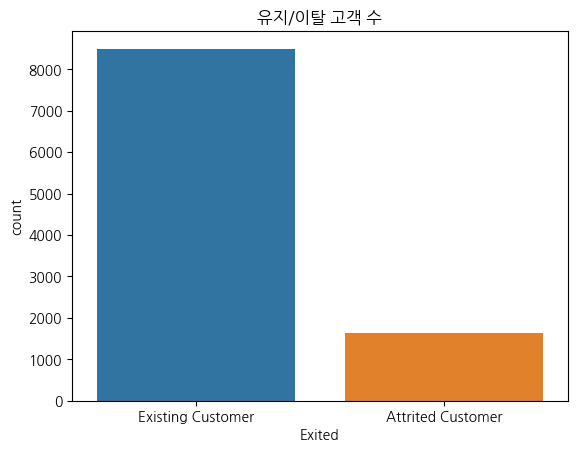

In [8]:
# '유지/이탈 고객 수'
sns.countplot(data=df, x='Exited')
plt.title('유지/이탈 고객 수')
plt.show()

In [9]:
# Check for unknown values
df[df == 'Unknown'].count()

Exited                0
Age                   0
Gender                0
Dependents            0
Education          1519
Marital             749
Income             1112
Card_type             0
Tenure                0
Product_Cnt           0
Inactive_Months       0
Contacts_Cnt          0
Credit_Limit          0
Revolv_Bal            0
Avg_OTB               0
Avg_Util_Ratio        0
Trans_Amt             0
Trans_Cnt             0
Amt_Chng_Q4_Q1        0
Cnt_Chng_Q4_Q1        0
dtype: int64

In [10]:
### Check for 0 values
df[df == 0].count()


Exited                0
Age                   0
Gender                0
Dependents          904
Education             0
Marital               0
Income                0
Card_type             0
Tenure                0
Product_Cnt           0
Inactive_Months      29
Contacts_Cnt        399
Credit_Limit          0
Revolv_Bal         2470
Avg_OTB               0
Avg_Util_Ratio     2470
Trans_Amt             0
Trans_Cnt             0
Amt_Chng_Q4_Q1        5
Cnt_Chng_Q4_Q1        7
dtype: int64

---

### ['Avg_Util_Ratio', 'Trans_Amt', 'Trans_Cnt', 'Amt_Chng_Q4_Q1', 'Cnt_Chng_Q4_Q1']

In [11]:
# 주요 컬럼들 간의 상관 관계 분석

df[['Avg_Util_Ratio', 'Trans_Amt', 'Trans_Cnt', 'Amt_Chng_Q4_Q1', 'Cnt_Chng_Q4_Q1']].corr()

,Avg_Util_Ratio,Trans_Amt,Trans_Cnt,Amt_Chng_Q4_Q1,Cnt_Chng_Q4_Q1
Avg_Util_Ratio,1.000000,-0.083034,0.002838,0.035235,0.074143
Trans_Amt,-0.083034,1.000000,0.807192,0.039678,0.085581
Trans_Cnt,0.002838,0.807192,1.000000,0.005469,0.112324
Amt_Chng_Q4_Q1,0.035235,0.039678,0.005469,1.000000,0.384189
Cnt_Chng_Q4_Q1,0.074143,0.085581,0.112324,0.384189,1.000000


### Avg_Util_Ratio: 고객의 평균 이용률 비율 (int)

Avg_Util_Ratio는 고객이 신용카드의 사용한 금액과 해당 신용카드의 신용 한도 사이의 비율을 의미합니다.이용률 비율은 고객이 현재 사용 중인 신용 한도에 대해 얼마나 많이 사용하고 있는지를 나타냅니다. 

예를 들어, 이용률 비율이 0.5인 경우, 고객은 현재 사용한 신용 한도의 절반을 사용하고 있는 것을 의미합니다. 이용률이 높을수록 고객이 신용 한도를 더 많이 사용하고 있음을 나타내며, 이는 신용 위험을 증가시킬 수 있습니다.

Avg_Util_Ratio는 고객의 신용 이용 패턴과 신용 카드의 활용 정도를 파악하는 데 사용될 수 있습니다. 이를 통해 고객의 신용 상태를 평가하고, 이탈 가능성 예측이나 신용카드 관리 전략 수립에 활용될 수 있습니다. 또한, 이용률 비율을 조정하여 신용 상태를 개선하거나 신용 한도 조정에 대한 결정을 할 수도 있습니다.

In [12]:
# 최소값과 최대값 찾기
min_urat = df['Avg_Util_Ratio'].min()
max_urat = df['Avg_Util_Ratio'].max()

print("최소:", min_urat)
print("최대:", max_urat)

최소: 0.0
최대: 0.999


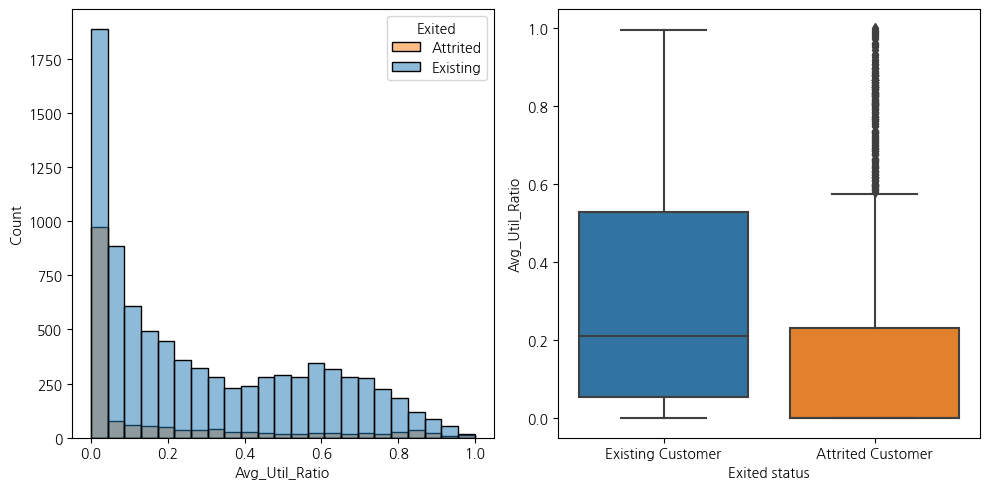

In [13]:
# 분포
# boxplot으로 이상치 확인

fig, ax = plt.subplots(1, 2, figsize= (10, 5))

ax1 = sns.histplot(data= df, x= 'Avg_Util_Ratio', hue= 'Exited', ax= ax[0])

ax1.legend(title= 'Exited', labels= ['Attrited','Existing'])
ax1.set_xlabel('Avg_Util_Ratio')
ax2 = sns.boxplot(data= df, y= 'Avg_Util_Ratio', x= 'Exited', ax= ax[1])

ax2.set_ylabel('Avg_Util_Ratio')
ax2.set_xlabel('Exited status')

plt.tight_layout()
plt.show()

이탈 고객의 대부분이 평균이용률이 0 이다.

하지만 많은 이상치들이 발견되었다. 이용률이 낮지 않아도 이탈하는 사람들이 있다는 뜻이다. 

이는 높은 이용률에도 신용카드 사용에 불만이 있다고 볼 수 있다.

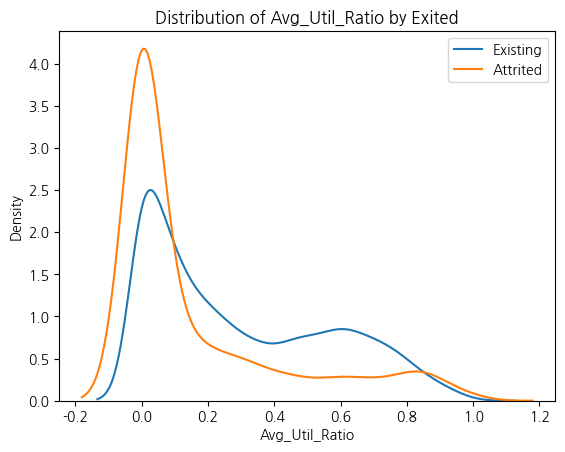

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt


# 'exist' 그룹의 분포
exist_customers = df[df['Exited'] == 'Existing Customer']
sns.kdeplot(data=exist_customers, x='Avg_Util_Ratio', label='Existing')

# 'attrited' 그룹의 분포
attrited_customers = df[df['Exited'] == 'Attrited Customer']
sns.kdeplot(data=attrited_customers, x='Avg_Util_Ratio', label='Attrited')

plt.xlabel('Avg_Util_Ratio')
plt.ylabel('Density')
plt.title('Distribution of Avg_Util_Ratio by Exited')
plt.legend()
plt.show()


신용카드 평균 이용률이 낮다는 것은 신용한도를 적게 사용한다는 것을 의미 즉, 고객이 주어진 신용한도 중 일부만을 사용하고 있다는 것을 나타냄.

이용률이 '0'인 경우, 신용카드를 전혀 이용하지 않는 고객일 가능성이 높다. '0' 이용률은 고객이 주어진 신용한도를 전혀 사용하지 않았음을 나타냄. 

이는 부채를 가지지 않고, 신용카드 사용에 대한 데이터가 없는 고객일 가능성이 있다.

In [15]:
len(df[(df['Avg_Util_Ratio'] == 0) & (df['Exited'] == 'Attrited Customer')])

893

In [16]:
len(df[(df['Avg_Util_Ratio'] == 0) & (df['Exited'] == 'Existing Customer')])

1577

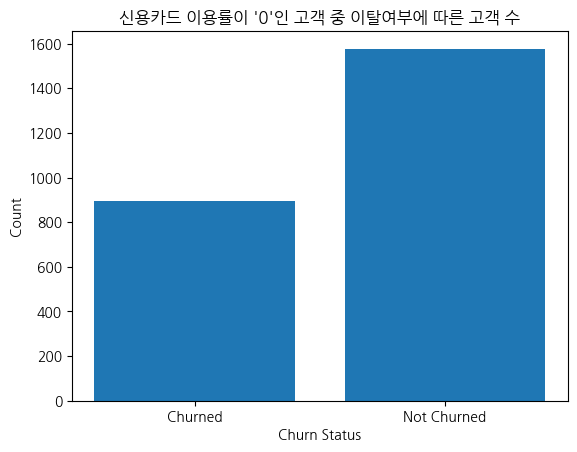

In [17]:
# 신용카드 이용률이 '0'인 고객 중 이탈여부에 따른 고객 수 

# 신용카드 이용률이 '0'인 고객 중 이탈
churned = len(df[(df['Avg_Util_Ratio'] == 0) & (df['Exited'] == 'Attrited Customer')])

# 신용카드 이용률이 '0'인 고객 중 유지
not_churned = len(df[(df['Avg_Util_Ratio'] == 0) & (df['Exited'] == 'Existing Customer')])

# 막대 그래프로 시각화
labels = ['Churned', 'Not Churned']
values = [churned, not_churned]

plt.bar(labels, values)
plt.xlabel('Churn Status')
plt.ylabel('Count')
plt.title("신용카드 이용률이 '0'인 고객 중 이탈여부에 따른 고객 수")
plt.show()


신용카드 이용률이 '0'인 고객 중에서도 이탈하지 않는 고객들이 많다.

따라서 이용률이 '0'인 고객 중 이탈한 고객들은 부채를 가지지 않는 경우인지 분석할 필요가 있다.

#### 다른컬럼과의 상관관계

#### 1-1) Revolv_Bal(리볼빙 발란스)

상관관계 분석을 통해서 고객의 부채를 나타내는 Revolv_Bal(리볼빙 발란스)와 상관관계가 높다는 것을 알아냈다(0.624022)

위의 결과에 따라 부채와의 상관관계 분석을 해보려고한다.

In [18]:
# 부채가 0인 경우가 있는지 확인 ('Revolv_Bal' 최소값과 최대값 찾기)
min_bal= df['Revolv_Bal'].min()
max_bal = df['Revolv_Bal'].max()

print("최소:", min_bal)
print("최대:", max_bal)

최소: 0
최대: 2517


부채를 가진 사람들/ 가지지 않은 사람들로 나누어서 확인해보려고 함

In [19]:
debt_customers = df[df['Revolv_Bal'] > 0]
no_debt_customers = df[df['Revolv_Bal'] == 0]

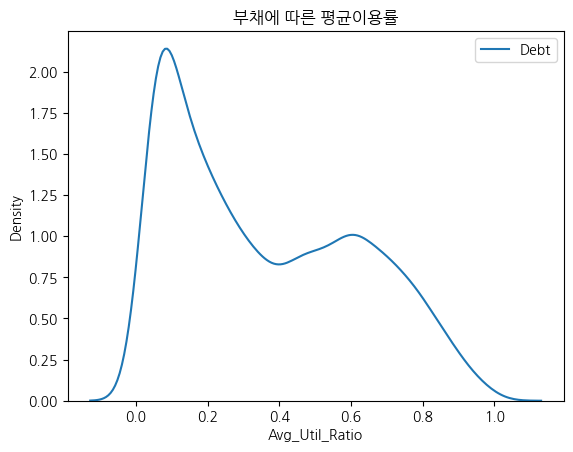

In [20]:
# 'Revolv_Bal'에 대한 신용카드 평균 이용률 분포

sns.kdeplot(data=debt_customers, x='Avg_Util_Ratio', label='Debt')
sns.kdeplot(data=no_debt_customers, x='Avg_Util_Ratio', label='No Debt')

plt.xlabel('Avg_Util_Ratio')
plt.ylabel('Density')
plt.title('부채에 따른 평균이용률')
plt.legend()
plt.show()


In [21]:
len(debt_customers)

7657

In [22]:
len(no_debt_customers)

2470

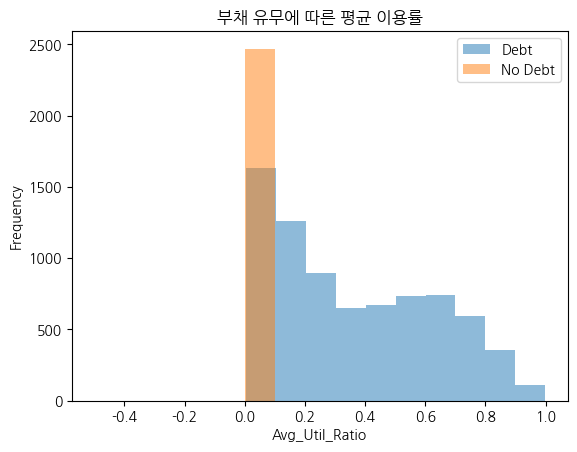

In [23]:
# histogram으로 그림

plt.hist(debt_customers['Avg_Util_Ratio'], bins=10, alpha=0.5, label='Debt')
plt.hist(no_debt_customers['Avg_Util_Ratio'], bins=10, alpha=0.5, label='No Debt')

plt.xlabel('Avg_Util_Ratio')
plt.ylabel('Frequency')
plt.title('부채 유무에 따른 평균 이용률')
plt.legend()
plt.show()


In [24]:
len(no_debt_customers[no_debt_customers['Avg_Util_Ratio'] > 0])

0

In [25]:
len(no_debt_customers)

2470

부채가 없는 사람들은 신용카드 이용률이 0이다. 하지만 이들 중에서도 이탈하지 않은 고객의 경우가 있다.

그럼 부채가 없는 사람들 중 신용카드 이용률이 0인 사람들((no_debt_customers))은 얼마나 이탈했을까?

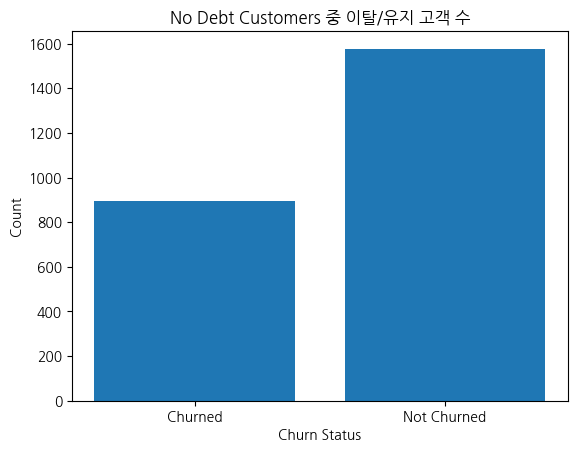

In [26]:
# 부채가 없고 이용률도 없는 고객(no_debt_customers) 중 이탈 분석

churned_customers = no_debt_customers[no_debt_customers['Exited'] == 'Attrited Customer']
not_churned_customers = no_debt_customers[no_debt_customers['Exited'] == 'Existing Customer']

churned_count = len(churned_customers)
not_churned_count = len(not_churned_customers)

labels = ['Churned', 'Not Churned']
values = [churned_count, not_churned_count]

plt.bar(labels, values)
plt.xlabel('Churn Status')
plt.ylabel('Count')
plt.title('No Debt Customers 중 이탈/유지 고객 수')
plt.show()

In [27]:
# 평균이용률이 0인 사람 중 이탈한 사람 수
len(df[(df['Avg_Util_Ratio'] == 0) & (df['Exited'] == 'Attrited Customer')])

893

In [28]:
# 부채가 없는 경우(평균 이용률도 없음) 이탈한 사람 수
len(no_debt_customers[no_debt_customers['Exited'] == 'Attrited Customer'])

893

In [29]:
len(no_debt_customers[no_debt_customers['Exited'] == 'Existing Customer'])

1577

부채가 없는 경우는 모두 평균이용률이 '0' 이었다.
평균이용률이 0인 고객중 이탈한 사람 수와 부채가 없는 경우 이탈한 사람 수를 비교해보니 그 수가 같았다.

따라서 이용률이 '0'인 고객 중 이탈한 고객들은 부채를 가지지 않는 경우라고 할 수 있다.

하지만 부채가 없고, 신용카드 평균 이용률이 0 인 고객이 반드시 이탈한 것은 아니다.(1600명 가량)

그럼...어떤 분석을 더 해야할까요...? 도와주세요!!!!(다른 컬럼과 연관분석)

부채가 있는 사람 중 낮은 이용률인 사람들이 있다.
그럼 낮은 이용률인 고객들은 부채를 얼마나 가지고 있을까? 

In [30]:
len(debt_customers[debt_customers['Avg_Util_Ratio'] < 0.3]) 

3776

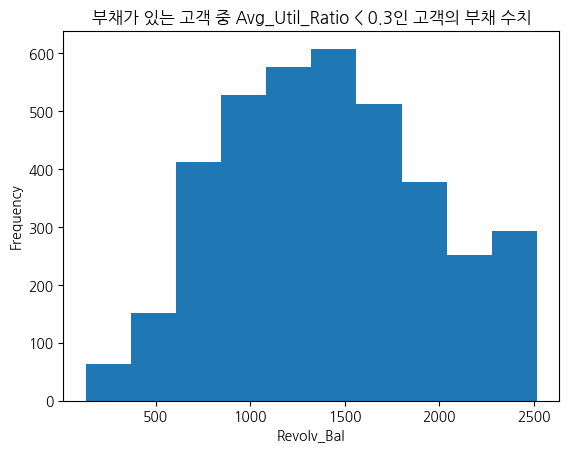

In [31]:
# 부채가 있는 사람 중 낮은 이용률인 고객들의 보유 부채
 
debt_customers_of_urat = debt_customers[debt_customers['Avg_Util_Ratio'] < 0.3]

plt.hist(debt_customers_of_urat['Revolv_Bal'], bins=10)
plt.xlabel('Revolv_Bal')
plt.ylabel('Frequency')
plt.title('부채가 있는 고객 중 Avg_Util_Ratio < 0.3인 고객의 부채 수치')
plt.show()


낮은 이용률에도 부채가 높은 사람들이 꽤 많다.

#### 1-2) Avg_OTB()
상관관계 분석을 통해서 Avg_OTB(고객의 평균잔액)와 상관관계가 높다는 것을 알아냈다(-0.538808)

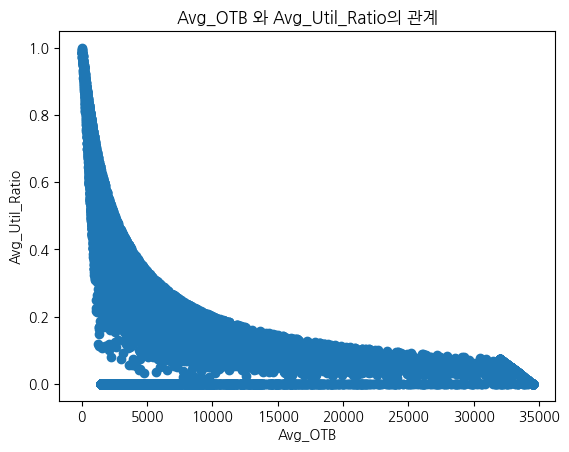

In [32]:
plt.scatter(df['Avg_OTB'], df['Avg_Util_Ratio'])
plt.xlabel('Avg_OTB')
plt.ylabel('Avg_Util_Ratio')
plt.title('Avg_OTB 와 Avg_Util_Ratio의 관계')
plt.show()

Avg_OTB가 높을수록 Avg_Util_Ratio는 낮아지는 경향을 보임.

Avg_OTB가 높을수록 고객이 아직 사용하지 않은 신용한도가 많다는 것을 의미

Avg_Util_Ratio는 신용카드의 평균 이용률로, 고객이 현재 사용 중인 신용한도의 비율을 나타냄.
따라서, Avg_Util_Ratio가 낮을수록 고객은 현재의 신용한도 중에서 적은 비율을 사용하고 있다는 것을 의미합니다.

따라서, Avg_OTB가 증가하면 고객이 아직 사용하지 않은 신용한도가 많아지므로 Avg_Util_Ratio가 감소하는 경향을 보인다.

#### 1-3) Credit_Limit(신용 한도)
상관관계 분석을 통해서 Credit_Limit(신용 한도)와 상관관계가 높다는 것을 알아냈다(-0.482965)

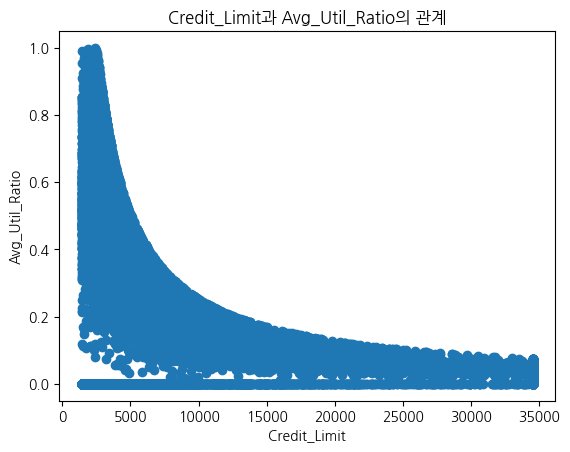

In [33]:
plt.scatter(df['Credit_Limit'], df['Avg_Util_Ratio'])
plt.xlabel('Credit_Limit')
plt.ylabel('Avg_Util_Ratio')
plt.title('Credit_Limit과 Avg_Util_Ratio의 관계')
plt.show()

Credit_Limit이 낮을수록 Avg_Util_Ratio는 높아지는 경향을 보임

Avg_Util_Ratio가 높다는 것은 고객이 신용 한도를 더 많이 사용하고 있음을 의미

- 신용한도가 적은데 이용률이 높다는게 무슨 의미일까?

신용한도가 적은데 이용률이 높다는 것은 고객이 할당받은 신용한도를 상당 부분 사용하고 있다는 의미입니다. 일반적으로 신용한도가 적을수록 신용카드를 더 많이 사용하고 있다는 것을 나타냅니다.

이러한 상황은 몇 가지 가능한 의미를 가질 수 있습니다:

1. 큰 소득 대비 큰 소비: 고객의 소득 수준에 비해 신용한도가 적지만, 고객이 큰 비율로 신용한도를 사용하는 경우입니다. 이는 해당 고객이 높은 소득을 가지고 있거나, 다른 금융 자산을 보유하고 있어서 추가적인 신용 한도를 얻을 필요가 없는 상황일 수 있습니다.

2. 긴급한 재정 상황: 신용한도가 적은데 이용률이 높은 경우, 해당 고객이 긴급한 재정 상황에 처한 상황일 수 있습니다. 예를 들어, 예기치 않은 긴급한 지출 또는 재정적 어려움으로 인해 신용카드를 사용하여 재정 상황을 해결하려는 경우일 수 있습니다.

3. 신용부채 상태: 고객이 다른 금융 제품에서 발생한 부채를 상환하기 위해 신용카드를 사용하는 경우입니다. 신용한도가 적은데 이용률이 높은 상황은 다른 부채를 상환하기 위해 신용카드를 활용하고 있으며, 이로 인해 신용카드의 신용한도를 더 많이 사용하는 것일 수 있습니다.


이 데이터로는 더이상 알 수 없는 것 같다..

---

### Trans_Amt: 총 거래 금액 (int)

고객이 일정 기간 동안 신용카드를 통해 총 얼마나 많은 금액을 소비했는지를 나타냅니다. 

총 거래금액이 높을수록 고객은 신용카드를 활발하게 사용하고 큰 금액을 소비하는 경향이 있습니다. 

이는 해당 고객이 높은 소비력을 가지고 있다거나, 상대적으로 고가의 상품이나 서비스를 많이 이용하는 등의 특징을 나타낼 수 있습니다.

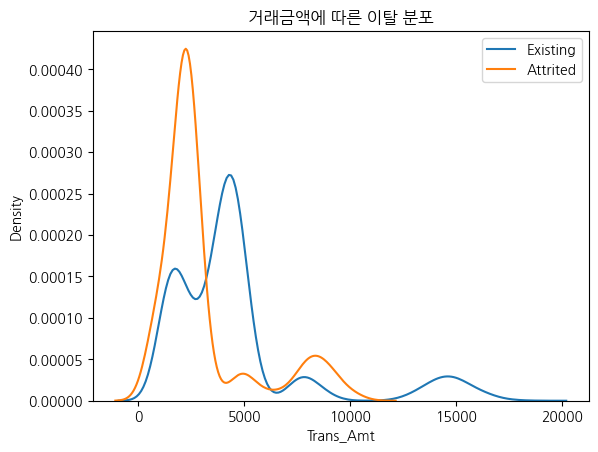

In [34]:
# 거래금액에 따른 이탈 분포

exist_customers = df[df['Exited'] == 'Existing Customer']
attrited_customers = df[df['Exited'] == 'Attrited Customer']

sns.kdeplot(data=exist_customers, x='Trans_Amt', label='Existing')
sns.kdeplot(data=attrited_customers, x='Trans_Amt', label='Attrited')

plt.xlabel('Trans_Amt')
plt.ylabel('Density')
plt.title('거래금액에 따른 이탈 분포')
plt.legend()
plt.show()

<Axes: xlabel='Exited', ylabel='Trans_Amt'>

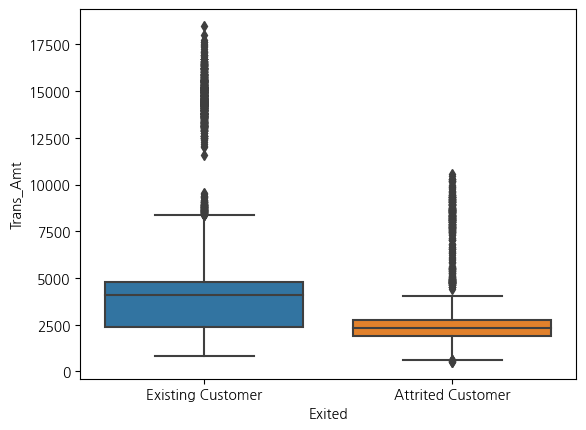

In [35]:
sns.boxplot(data=df, x='Exited', y='Trans_Amt')

거래금액이 적을수록 이탈하는 사람 많다

- 총금액/기간으로 해서 소비량을 측정해 이탈과 연관성 분석

In [36]:
df.head(2)

,Exited,Age,Gender,Dependents,Education,Marital,Income,Card_type,Tenure,Product_Cnt,Inactive_Months,Contacts_Cnt,Credit_Limit,Revolv_Bal,Avg_OTB,Avg_Util_Ratio,Trans_Amt,Trans_Cnt,Amt_Chng_Q4_Q1,Cnt_Chng_Q4_Q1
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,0.061,1144,42,1.335,1.625
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,0.105,1291,33,1.541,3.714


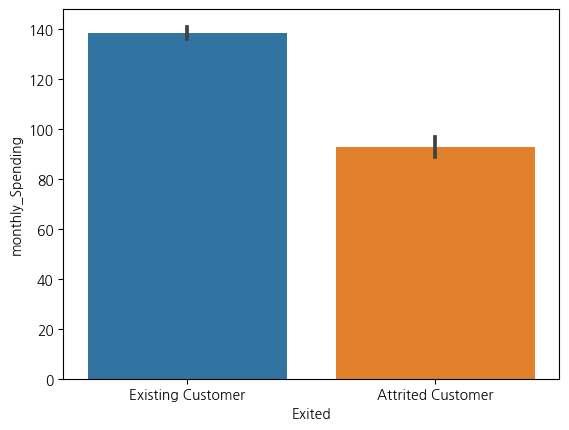

In [37]:
df['monthly_Spending'] = df['Trans_Amt'] / df['Tenure']

sns.barplot(data=df, x='Exited', y='monthly_Spending');

유지 고객의 월간 소비량이 이탈 고객보다 높다.

<Axes: xlabel='Exited', ylabel='monthly_Spending'>

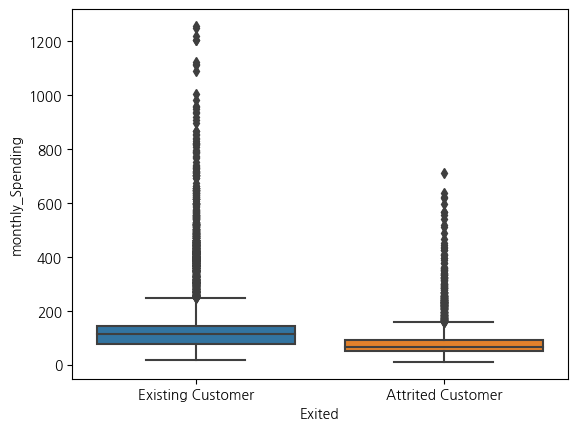

In [38]:
sns.boxplot(data=df, x='Exited', y='monthly_Spending')

- 연령별 거래금액

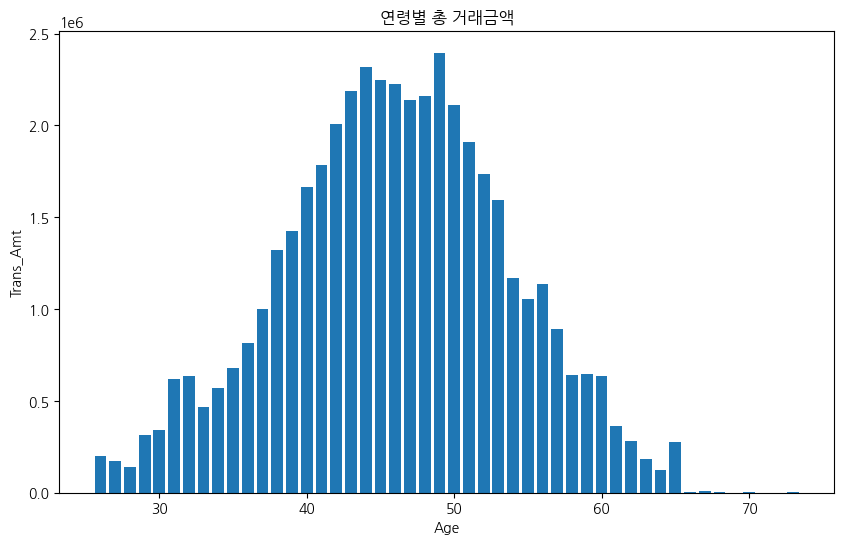

In [39]:
# 연령별 총 거래금액

age_total_amount = df.groupby('Age')['Trans_Amt'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(age_total_amount['Age'], age_total_amount['Trans_Amt'])
plt.xlabel('Age')
plt.ylabel('Trans_Amt')
plt.title('연령별 총 거래금액')
plt.show()

- 결혼 여부별 거래금액

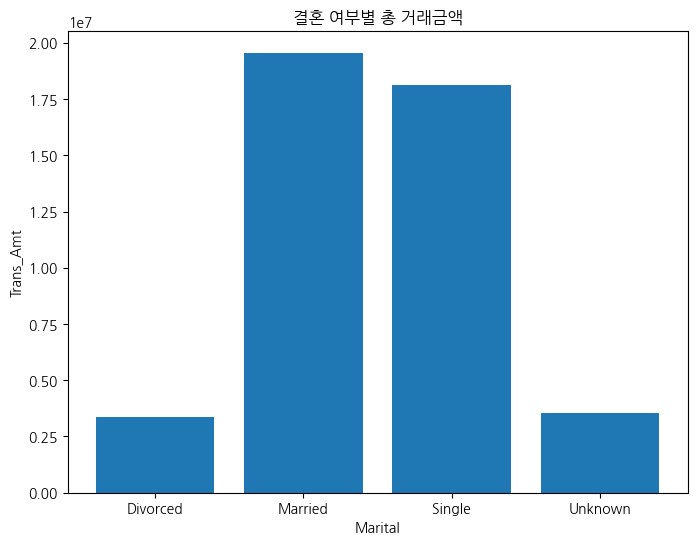

In [40]:
# 결혼 여부별 총 거래금액 계산

marital_total_amount = df.groupby('Marital')['Trans_Amt'].sum().reset_index()

plt.figure(figsize=(8, 6))
plt.bar(marital_total_amount['Marital'], marital_total_amount['Trans_Amt'])
plt.xlabel('Marital')
plt.ylabel('Trans_Amt')
plt.title('결혼 여부별 총 거래금액')
plt.show()

- 총 거래금액과 총 거래 횟수의 관계

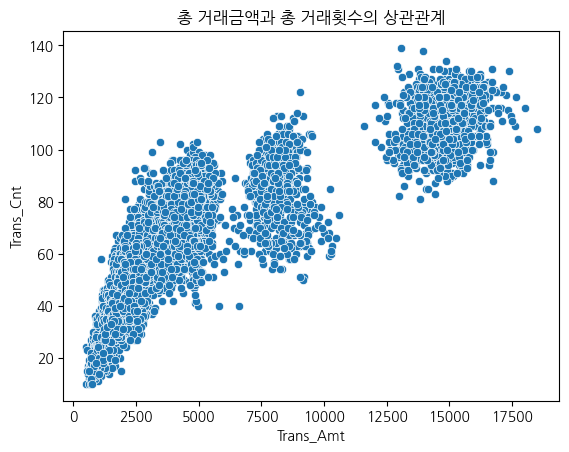

In [41]:
sns.scatterplot(data=df, x='Trans_Amt', y='Trans_Cnt')
plt.xlabel('Trans_Amt')
plt.ylabel('Trans_Cnt')
plt.title('총 거래금액과 총 거래횟수의 상관관계')
plt.show()

---

### Trans_Cnt: 총 거래 횟수 (int)

고객이 일정 기간 동안 신용카드를 통해 총 몇 번이나 거래를 수행했는지를 나타냅니다. 

총 거래횟수가 높을수록 고객은 더 많은 횟수로 신용카드를 사용하고 있는 것을 의미합니다. 

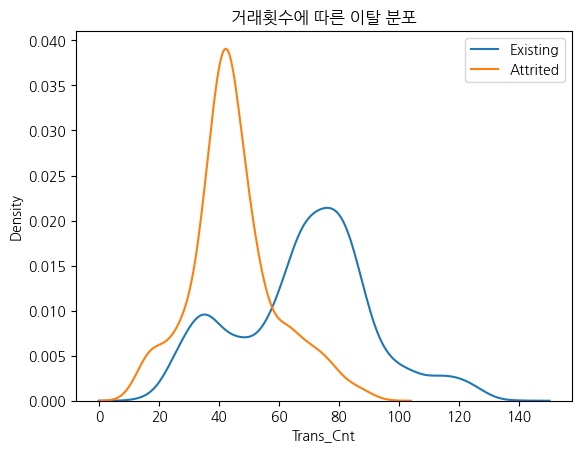

In [42]:
# 거래횟수에 따른 이탈 분포

exist_customers = df[df['Exited'] == 'Existing Customer']
attrited_customers = df[df['Exited'] == 'Attrited Customer']

sns.kdeplot(data=exist_customers, x='Trans_Cnt', label='Existing')
sns.kdeplot(data=attrited_customers, x='Trans_Cnt', label='Attrited')

plt.xlabel('Trans_Cnt')
plt.ylabel('Density')
plt.title('거래횟수에 따른 이탈 분포')
plt.legend()
plt.show()

<Axes: xlabel='Exited', ylabel='Trans_Cnt'>

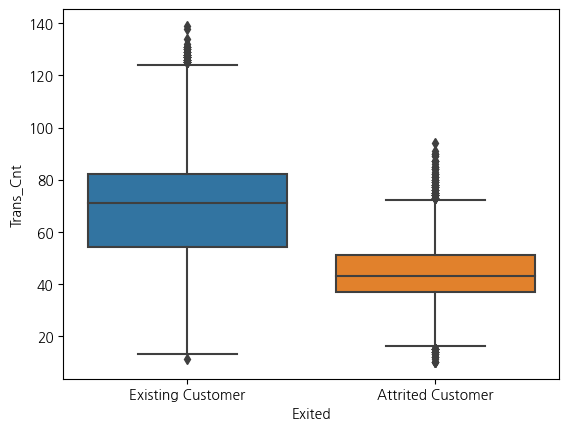

In [43]:
sns.boxplot(data=df, x='Exited', y='Trans_Cnt')


거래횟수가 낮을수록 이탈 고객수가 많다 (30 ~ 60 사이)

거래횟수가 높을수록 유지 고객수가 많다 (60 ~ 100 사이)

- 연령별 총 거래 횟수

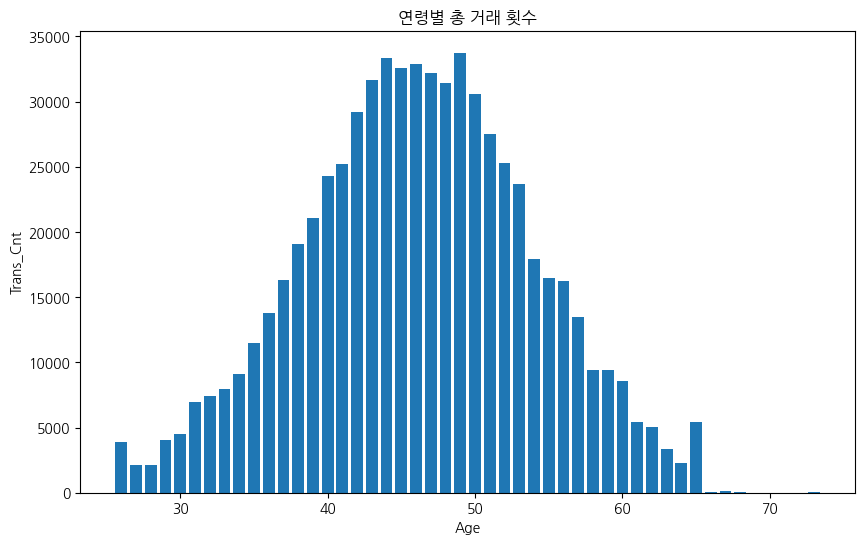

In [44]:
# 연령별 총 거래 횟수

age_total_amount = df.groupby('Age')['Trans_Cnt'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(age_total_amount['Age'], age_total_amount['Trans_Cnt'])
plt.xlabel('Age')
plt.ylabel('Trans_Cnt')
plt.title('연령별 총 거래 횟수')
plt.show()

- 결혼 여부별 총 거래 횟수

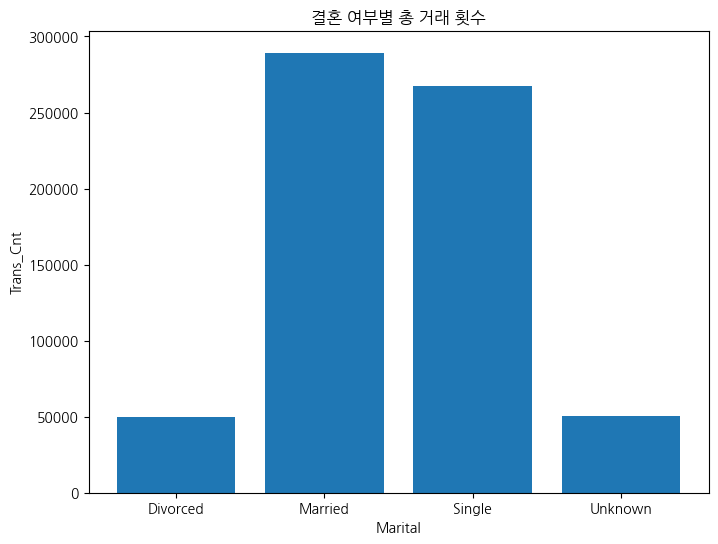

In [45]:
# 결혼 여부별 총 거래 횟수

marital_total_amount = df.groupby('Marital')['Trans_Cnt'].sum().reset_index()

plt.figure(figsize=(8, 6))
plt.bar(marital_total_amount['Marital'], marital_total_amount['Trans_Cnt'])
plt.xlabel('Marital')
plt.ylabel('Trans_Cnt')
plt.title('결혼 여부별 총 거래 횟수')
plt.show()

---

### Amt_Chng_Q4_Q1: 4분기에서 1분기로의 총 금액 변동 (int)

In [46]:
df['Amt_Chng_Q4_Q1'].describe()

count    10127.000000
mean         0.759941
std          0.219207
min          0.000000
25%          0.631000
50%          0.736000
75%          0.859000
max          3.397000
Name: Amt_Chng_Q4_Q1, dtype: float64

- 금액 변동과 거래 횟수 상관관계

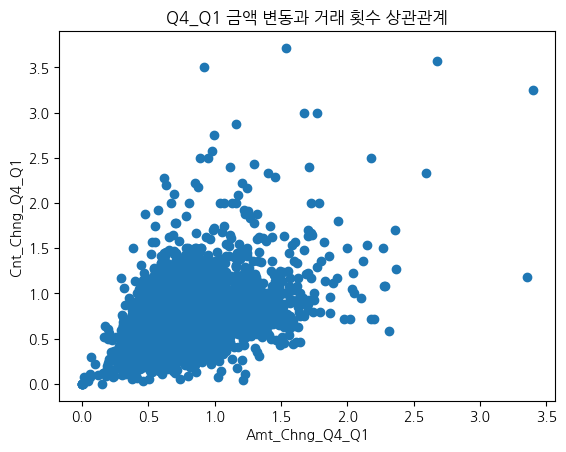

In [47]:
# 산점도 그래프로 금액 변동과 거래 횟수  상관관계

plt.scatter(df['Amt_Chng_Q4_Q1'], df['Cnt_Chng_Q4_Q1'])
plt.xlabel('Amt_Chng_Q4_Q1')
plt.ylabel('Cnt_Chng_Q4_Q1')
plt.title('Q4_Q1 금액 변동과 거래 횟수 상관관계')
plt.show()

- 이탈 여부에 따른 금액 변동 시각화

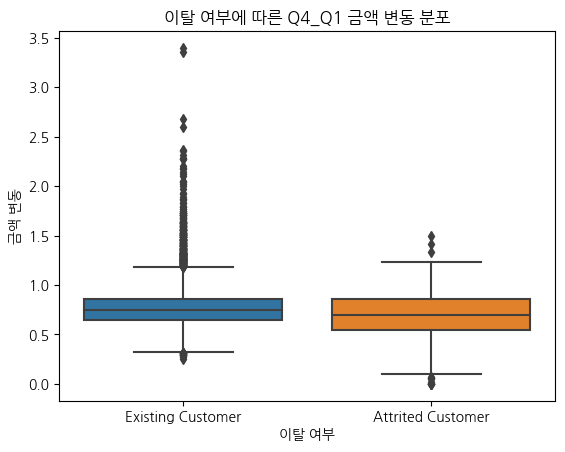

In [48]:
# 이탈 여부에 따른 금액 변동 시각화

sns.boxplot(data=df, x='Exited', y='Amt_Chng_Q4_Q1')
plt.xlabel('이탈 여부')
plt.ylabel('금액 변동')
plt.title('이탈 여부에 따른 Q4_Q1 금액 변동 분포')
plt.show()

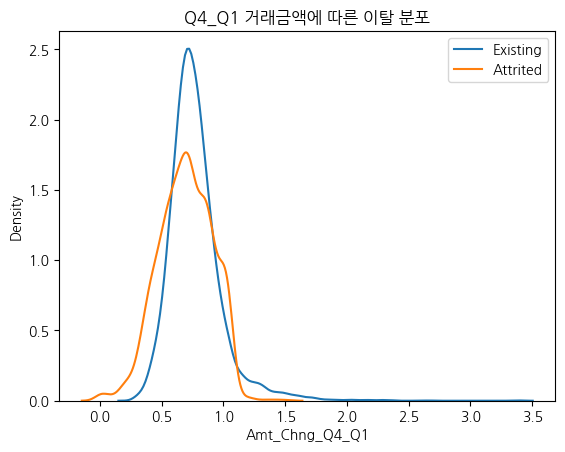

In [49]:
# 거래금액에 따른 이탈 분포

exist_customers = df[df['Exited'] == 'Existing Customer']
attrited_customers = df[df['Exited'] == 'Attrited Customer']

sns.kdeplot(data=exist_customers, x='Amt_Chng_Q4_Q1', label='Existing')
sns.kdeplot(data=attrited_customers, x='Amt_Chng_Q4_Q1', label='Attrited')

plt.xlabel('Amt_Chng_Q4_Q1')
plt.ylabel('Density')
plt.title('Q4_Q1 거래금액에 따른 이탈 분포')
plt.legend()
plt.show()

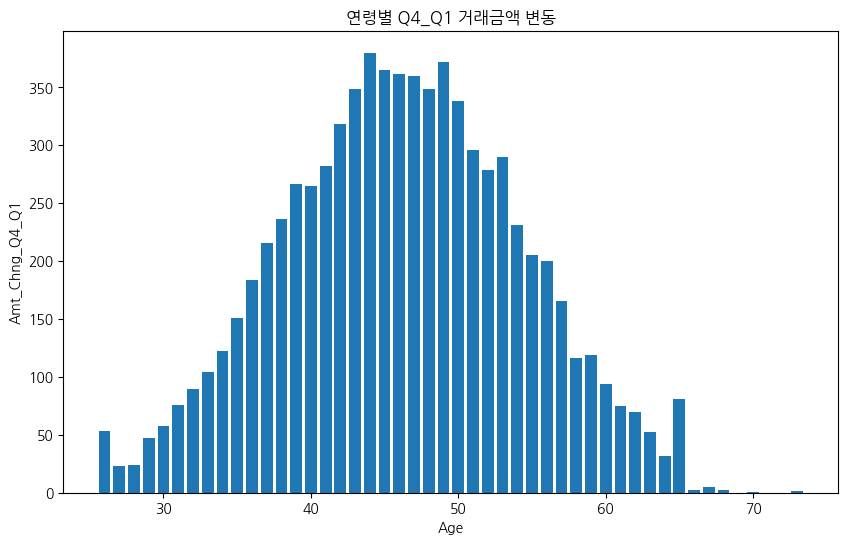

In [50]:
# 연령별 Q4_Q1 거래금액 변동

age_total_amount = df.groupby('Age')['Amt_Chng_Q4_Q1'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(age_total_amount['Age'], age_total_amount['Amt_Chng_Q4_Q1'])
plt.xlabel('Age')
plt.ylabel('Amt_Chng_Q4_Q1')
plt.title('연령별 Q4_Q1 거래금액 변동')
plt.show()

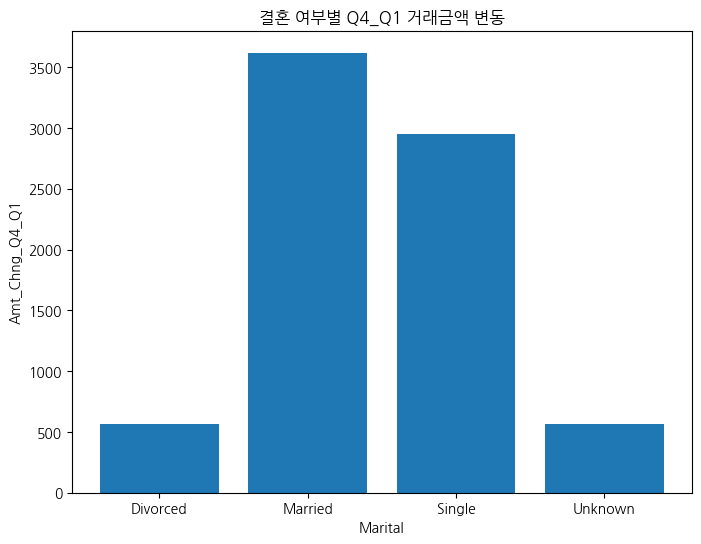

In [51]:
# 결혼 여부별 Q4_Q1 거래금액 변동

marital_total_amount = df.groupby('Marital')['Amt_Chng_Q4_Q1'].sum().reset_index()

plt.figure(figsize=(8, 6))
plt.bar(marital_total_amount['Marital'], marital_total_amount['Amt_Chng_Q4_Q1'])
plt.xlabel('Marital')
plt.ylabel('Amt_Chng_Q4_Q1')
plt.title('결혼 여부별 Q4_Q1 거래금액 변동')
plt.show()

---

### Cnt_Chng_Q4_Q1: 4분기에서 1분기로의 총 거래 횟수 변동 (int)

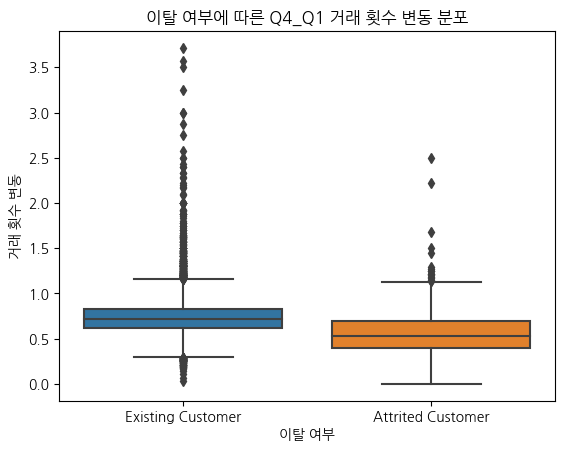

In [52]:
# 이탈 여부에 따른 거래 횟수 변동 시각화

sns.boxplot(data=df, x='Exited', y='Cnt_Chng_Q4_Q1')
plt.xlabel('이탈 여부')
plt.ylabel('거래 횟수 변동')
plt.title('이탈 여부에 따른 Q4_Q1 거래 횟수 변동 분포')
plt.show()

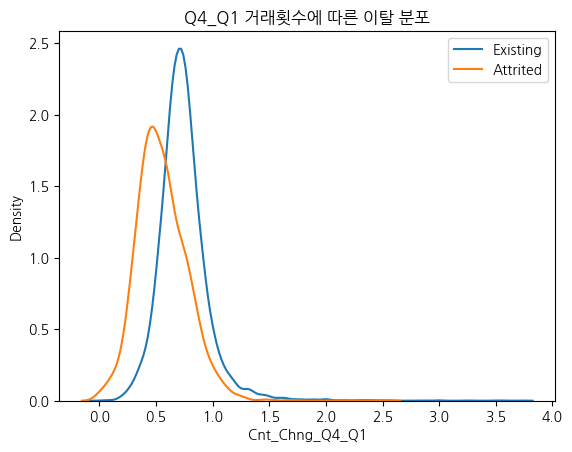

In [53]:
# 거래횟수에 따른 이탈 분포

exist_customers = df[df['Exited'] == 'Existing Customer']
attrited_customers = df[df['Exited'] == 'Attrited Customer']

sns.kdeplot(data=exist_customers, x='Cnt_Chng_Q4_Q1', label='Existing')
sns.kdeplot(data=attrited_customers, x='Cnt_Chng_Q4_Q1', label='Attrited')

plt.xlabel('Cnt_Chng_Q4_Q1')
plt.ylabel('Density')
plt.title('Q4_Q1 거래횟수에 따른 이탈 분포')
plt.legend()
plt.show()

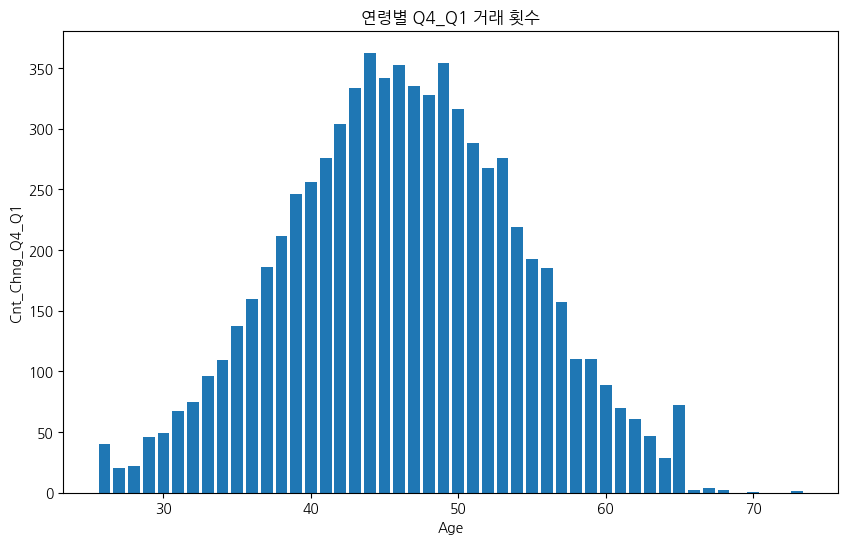

In [54]:
# 연령별 Q4_Q1 거래 횟수

age_total_amount = df.groupby('Age')['Cnt_Chng_Q4_Q1'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(age_total_amount['Age'], age_total_amount['Cnt_Chng_Q4_Q1'])
plt.xlabel('Age')
plt.ylabel('Cnt_Chng_Q4_Q1')
plt.title('연령별 Q4_Q1 거래 횟수')
plt.show()

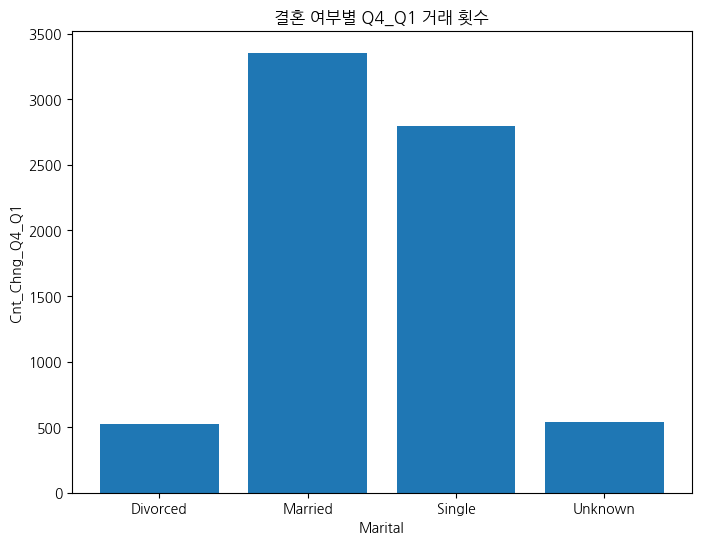

In [55]:
# 결혼 여부별 총 거래 횟수

marital_total_amount = df.groupby('Marital')['Cnt_Chng_Q4_Q1'].sum().reset_index()

plt.figure(figsize=(8, 6))
plt.bar(marital_total_amount['Marital'], marital_total_amount['Cnt_Chng_Q4_Q1'])
plt.xlabel('Marital')
plt.ylabel('Cnt_Chng_Q4_Q1')
plt.title('결혼 여부별 Q4_Q1 거래 횟수')
plt.show()

---

boxplot

In [56]:
df.col

Index(['Exited', 'Age', 'Gender', 'Dependents', 'Education', 'Marital',
       'Income', 'Card_type', 'Tenure', 'Product_Cnt', 'Inactive_Months',
       'Contacts_Cnt', 'Credit_Limit', 'Revolv_Bal', 'Avg_OTB',
       'Avg_Util_Ratio', 'Trans_Amt', 'Trans_Cnt', 'Amt_Chng_Q4_Q1',
       'Cnt_Chng_Q4_Q1', 'monthly_Spending'],
      dtype='object')

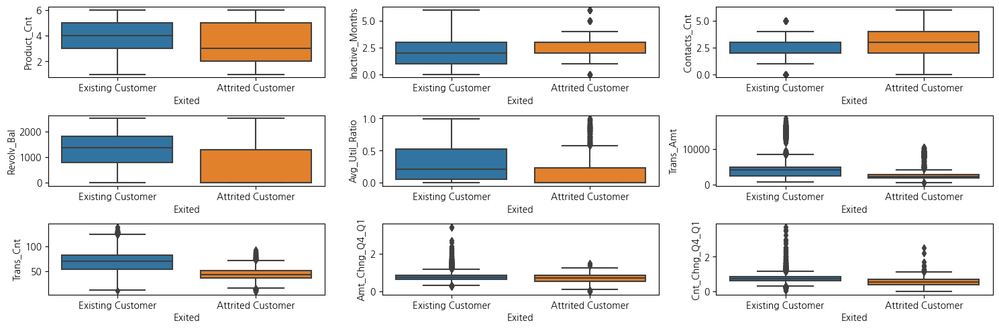

In [66]:
# 9개 boxplot 그리기

plt.figure(figsize=(15, 5))
plt.subplots_adjust(wspace=0.4)

plt.subplot(3, 3, 1)
sns.boxplot(data=df, x='Exited', y='Product_Cnt')

plt.subplot(3, 3, 2)
sns.boxplot(data=df, x='Exited', y='Inactive_Months')

plt.subplot(3, 3, 3)
sns.boxplot(data=df, x='Exited', y='Contacts_Cnt')

plt.subplot(3, 3, 4)
sns.boxplot(data=df, x='Exited', y='Revolv_Bal')

plt.subplot(3, 3, 5)
sns.boxplot(data=df, x='Exited', y='Avg_Util_Ratio')

plt.subplot(3, 3, 6)
sns.boxplot(data=df, x='Exited', y='Trans_Amt')

plt.subplot(3, 3, 7)
sns.boxplot(data=df, x='Exited', y='Trans_Cnt')

plt.subplot(3, 3, 8)
sns.boxplot(data=df, x='Exited', y='Amt_Chng_Q4_Q1')

plt.subplot(3, 3, 9)
sns.boxplot(data=df, x='Exited', y='Cnt_Chng_Q4_Q1')

plt.tight_layout()
plt.show()

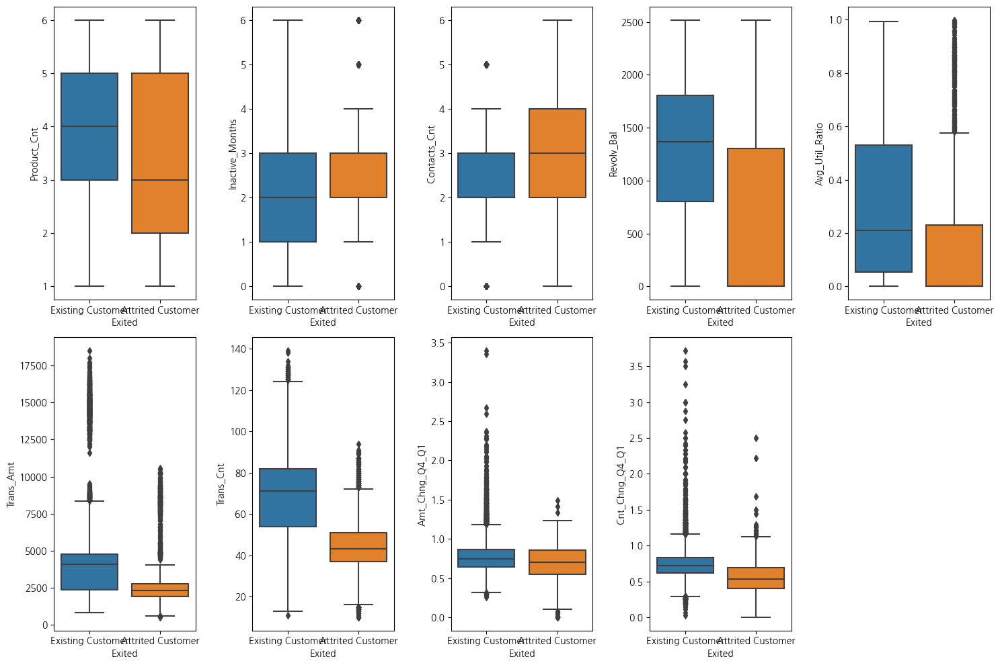

In [64]:
# 9개의 boxplot 그리기 (2줄로 나눔)

plt.figure(figsize=(15, 10))

plt.subplot(2, 5, 1)
sns.boxplot(data=df, x='Exited', y='Product_Cnt')

plt.subplot(2, 5, 2)
sns.boxplot(data=df, x='Exited', y='Inactive_Months')

plt.subplot(2, 5, 3)
sns.boxplot(data=df, x='Exited', y='Contacts_Cnt')

plt.subplot(2, 5, 4)
sns.boxplot(data=df, x='Exited', y='Revolv_Bal')

plt.subplot(2, 5, 5)
sns.boxplot(data=df, x='Exited', y='Avg_Util_Ratio')

plt.subplot(2, 5, 6)
sns.boxplot(data=df, x='Exited', y='Trans_Amt')

plt.subplot(2, 5, 7)
sns.boxplot(data=df, x='Exited', y='Trans_Cnt')

plt.subplot(2, 5, 8)
sns.boxplot(data=df, x='Exited', y='Amt_Chng_Q4_Q1')

plt.subplot(2, 5, 9)
sns.boxplot(data=df, x='Exited', y='Cnt_Chng_Q4_Q1')

plt.tight_layout()  # 서브플롯 간 간격을 자동으로 조정
plt.show()


---

산점도

In [12]:
# 변수별 encoding
mapping = {
    'Exited': {'Existing Customer': 0, 'Attrited Customer': 1},
    'Gender': {'M': 0, 'F': 1},
    'Education': {'Uneducated': 0, 'High School': 1, 'College': 2, 'Graduate' : 3, 'Post-Graduate': 4, 'Doctorate': 5, 'Unknown': 6},
    'Marital': {'Single': 0, 'Married': 1, 'Divorced': 2, 'Unknown': 3},
    'Income': {'Less than $40K': 0, '$40K - $60K': 1, '$60K - $80K': 2, '$80K - $120K': 3, '$120K +': 4, 'Unknown': 5},
    'Card_Type': {'Blue': 0, 'Silver': 1, 'Gold': 2, 'Platinum': 3}
}

df = df.replace(mapping)

df

,Exited,Age,Gender,Dependents,Education,Marital,Income,Card_Type,Tenure,Product_Cnt,Inactive_Months,Contacts_Cnt,Credit_Limit,Revolv_Bal,Avg_OTB,Avg_Util_Ratio,Trans_Amt,Trans_Cnt,Amt_Chng_Q4_Q1,Cnt_Chng_Q4_Q1
0,0,45,0,3,1,1,2,0,39,5,1,3,12691.0,777,11914.0,0.061,1144,42,1.335,1.625
1,0,49,1,5,3,0,0,0,44,6,1,2,8256.0,864,7392.0,0.105,1291,33,1.541,3.714
2,0,51,0,3,3,1,3,0,36,4,1,0,3418.0,0,3418.0,0.000,1887,20,2.594,2.333
3,0,40,1,4,1,3,0,0,34,3,4,1,3313.0,2517,796.0,0.760,1171,20,1.405,2.333
4,0,40,0,3,0,1,2,0,21,5,1,0,4716.0,0,4716.0,0.000,816,28,2.175,2.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,0,2,3,0,1,0,40,3,2,3,4003.0,1851,2152.0,0.462,15476,117,0.703,0.857
10123,1,41,0,2,6,2,1,0,25,4,2,3,4277.0,2186,2091.0,0.511,8764,69,0.804,0.683
10124,1,44,1,1,1,1,0,0,36,5,3,4,5409.0,0,5409.0,0.000,10291,60,0.819,0.818
10125,1,30,0,2,3,3,1,0,36,4,3,3,5281.0,0,5281.0,0.000,8395,62,0.535,0.722


In [13]:
df.columns

Index(['Exited', 'Age', 'Gender', 'Dependents', 'Education', 'Marital',
       'Income', 'Card_Type', 'Tenure', 'Product_Cnt', 'Inactive_Months',
       'Contacts_Cnt', 'Credit_Limit', 'Revolv_Bal', 'Avg_OTB',
       'Avg_Util_Ratio', 'Trans_Amt', 'Trans_Cnt', 'Amt_Chng_Q4_Q1',
       'Cnt_Chng_Q4_Q1'],
      dtype='object')

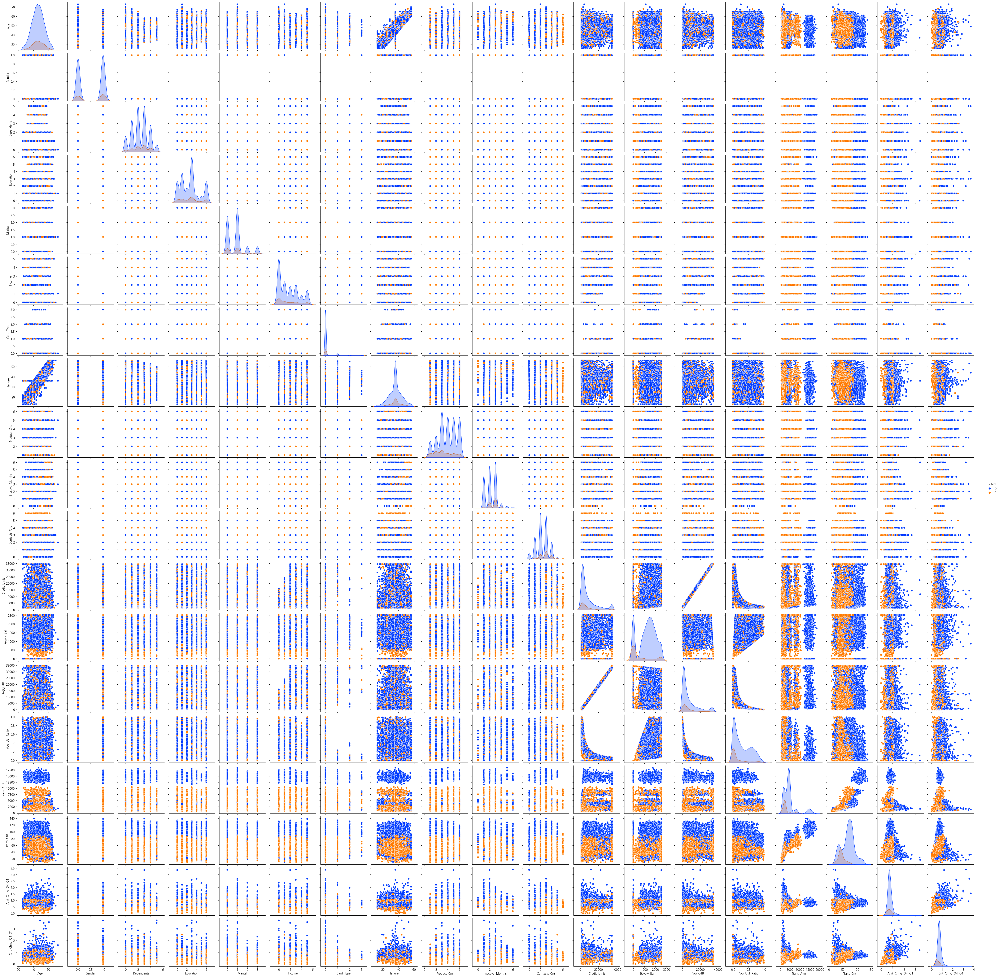

In [14]:
# 전체 산점도

sns.pairplot(df, 
             diag_kind='kde', 
             hue='Exited', 
             palette='bright')

plt.show()

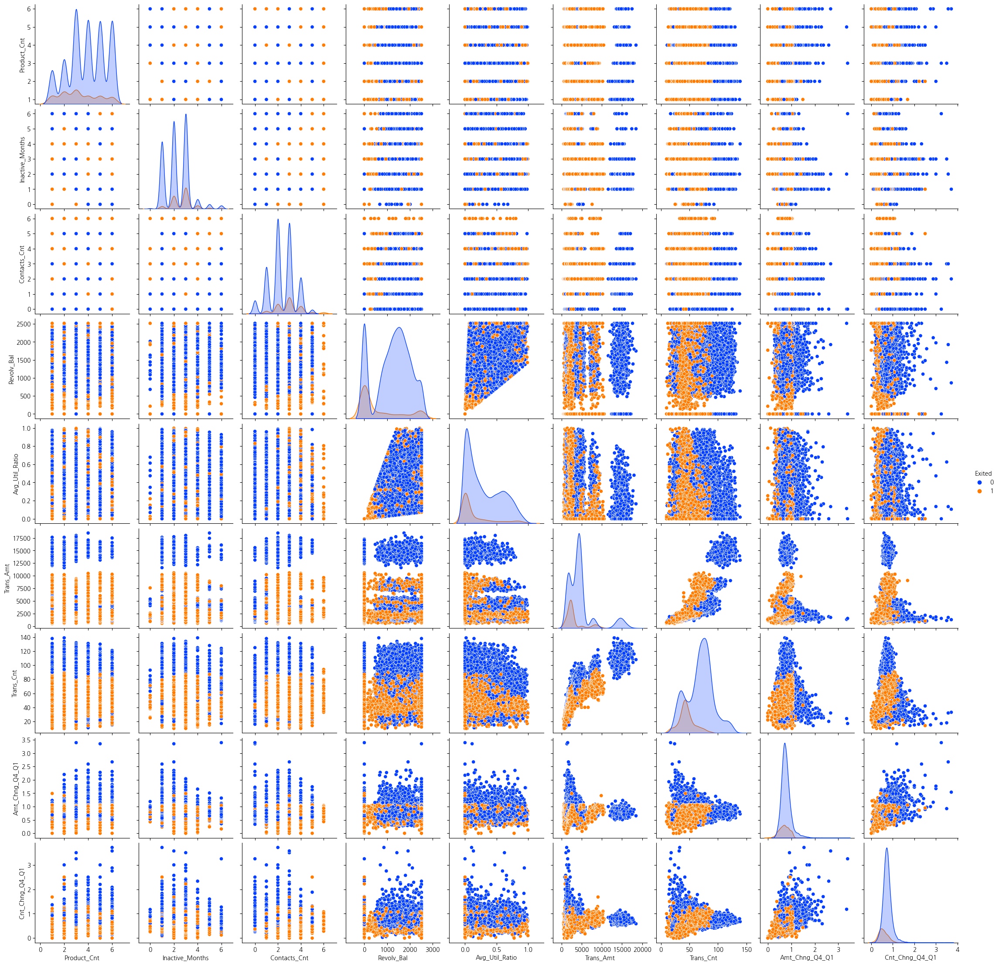

In [15]:
# 9개 산점도

sns.pairplot(df[['Exited','Product_Cnt', 'Inactive_Months', 'Contacts_Cnt', 'Revolv_Bal', 'Avg_Util_Ratio', 'Trans_Amt', 'Trans_Cnt', 'Amt_Chng_Q4_Q1', 'Cnt_Chng_Q4_Q1']], 
             diag_kind='kde', 
             hue='Exited', 
             palette='bright')

plt.show()